In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [8]:
df = pd.read_csv(R'C:\Users\HP2022\Desktop\accident data.csv')

In [18]:
df.iloc[50000:60001] 


,Index,Accident_Severity,Accident Date,Latitude,Light_Conditions,District Area,Longitude,Number_of_Casualties,Number_of_Vehicles,Road_Surface_Conditions,Road_Type,Urban_or_Rural_Area,Weather_Conditions,Vehicle_Type
50000,200711BD13820,Serious,24-08-2019,54.733068,Daylight,Durham,-1.518390,4,5,Dry,Dual carriageway,Rural,Fine no high winds,Taxi/Private hire car
50001,200711BD13950,Slight,21-08-2019,54.713487,Daylight,Durham,-1.498598,1,2,Dry,Single carriageway,Rural,Fine no high winds,Motorcycle over 125cc and up to 500cc
50002,200711BD14060,Slight,24-08-2019,54.777431,Daylight,Durham,-1.533099,3,2,Dry,Dual carriageway,Rural,Fine no high winds,Car
50003,200711BD14190,Slight,01-09-2019,54.752926,Daylight,Durham,-1.591025,2,2,Dry,Roundabout,Rural,Fine no high winds,Taxi/Private hire car
50004,200711BD14240,Slight,09-08-2019,54.813361,Daylight,Durham,-1.506232,1,1,Dry,Single carriageway,Rural,Fine no high winds,Car
50005,200711BD14280,Slight,24-08-2019,54.708706,Daylight,Durham,-1.539476,2,2,Dry,Single carriageway,Rural,Fine no high winds,Car
50006,200711BD14600,Slight,07-09-2019,54.807615,Daylight,Durham,-1.634658,1,1,Dry,Single carriageway,Rural,Fine no high winds,Motorcycle 125cc and under
50007,200711BD14610,Slight,07-09-2019,54.819277,Daylight,Durham,-1.573235,3,3,Dry,Single carriageway,Rural,Fine no high winds,Car
50008,200711BD14700,Slight,06-09-2019,54.726433,Darkness - no lighting,Durham,-1.522195,2,2,Wet or damp,Dual carriageway,Rural,Fine no high winds,Car
50009,200711BD14810,Slight,06-09-2019,54.805401,Daylight,Durham,-1.645568,1,2,Dry,Roundabout,Rural,Fine no high winds,Car


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 660679 entries, 0 to 660678
Data columns (total 14 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Index                    660679 non-null  object 
 1   Accident_Severity        660679 non-null  object 
 2   Accident Date            660679 non-null  object 
 3   Latitude                 660654 non-null  float64
 4   Light_Conditions         660679 non-null  object 
 5   District Area            660679 non-null  object 
 6   Longitude                660653 non-null  float64
 7   Number_of_Casualties     660679 non-null  int64  
 8   Number_of_Vehicles       660679 non-null  int64  
 9   Road_Surface_Conditions  659953 non-null  object 
 10  Road_Type                656159 non-null  object 
 11  Urban_or_Rural_Area      660664 non-null  object 
 12  Weather_Conditions       646551 non-null  object 
 13  Vehicle_Type             660679 non-null  object 
dtypes: f

In [5]:
df['Accident Date'] = pd.to_datetime(df['Accident Date'] , format = '%d-%m-%Y')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 660679 entries, 0 to 660678
Data columns (total 14 columns):
 #   Column                   Non-Null Count   Dtype         
---  ------                   --------------   -----         
 0   Index                    660679 non-null  object        
 1   Accident_Severity        660679 non-null  object        
 2   Accident Date            660679 non-null  datetime64[ns]
 3   Latitude                 660654 non-null  float64       
 4   Light_Conditions         660679 non-null  object        
 5   District Area            660679 non-null  object        
 6   Longitude                660653 non-null  float64       
 7   Number_of_Casualties     660679 non-null  int64         
 8   Number_of_Vehicles       660679 non-null  int64         
 9   Road_Surface_Conditions  659953 non-null  object        
 10  Road_Type                656159 non-null  object        
 11  Urban_or_Rural_Area      660664 non-null  object        
 12  Weather_Conditio

In [7]:
df.describe()

,Latitude,Longitude,Number_of_Casualties,Number_of_Vehicles
count,660654.000000,660653.000000,660679.000000,660679.000000
mean,52.553866,-1.431210,1.357040,1.831255
std,1.406922,1.383330,0.824847,0.715269
min,49.914430,-7.516225,1.000000,1.000000
25%,51.490690,-2.332291,1.000000,1.000000
50%,52.315641,-1.411667,1.000000,2.000000
75%,53.453452,-0.232869,1.000000,2.000000
max,60.757544,1.762010,68.000000,32.000000


In [8]:
df.describe(include = 'object')

,Index,Accident_Severity,Light_Conditions,District Area,Road_Surface_Conditions,Road_Type,Urban_or_Rural_Area,Weather_Conditions,Vehicle_Type
count,660679,660679,660679,660679,659953,656159,660664,646551,660679
unique,421020,3,5,422,5,5,3,8,16
top,2.01E+12,Slight,Daylight,Birmingham,Dry,Single carriageway,Urban,Fine no high winds,Car
freq,239478,563801,484880,13491,447821,492143,421663,520885,497992


In [9]:
df.duplicated().value_counts()

False    660660
True         19
dtype: int64

In [10]:
df.drop_duplicates(keep = 'first' , inplace = True)

In [11]:
df.duplicated().value_counts()

False    660660
dtype: int64

In [12]:
df.isnull().sum()

Index                          0
Accident_Severity              0
Accident Date                  0
Latitude                      25
Light_Conditions               0
District Area                  0
Longitude                     26
Number_of_Casualties           0
Number_of_Vehicles             0
Road_Surface_Conditions      726
Road_Type                   4520
Urban_or_Rural_Area           15
Weather_Conditions         14127
Vehicle_Type                   0
dtype: int64

In [13]:
missing_percentage = (df.isnull().sum() / len(df)) * 100
print(missing_percentage)


Index                      0.000000
Accident_Severity          0.000000
Accident Date              0.000000
Latitude                   0.003784
Light_Conditions           0.000000
District Area              0.000000
Longitude                  0.003935
Number_of_Casualties       0.000000
Number_of_Vehicles         0.000000
Road_Surface_Conditions    0.109890
Road_Type                  0.684164
Urban_or_Rural_Area        0.002270
Weather_Conditions         2.138316
Vehicle_Type               0.000000
dtype: float64


In [14]:
pip install missingno

Note: you may need to restart the kernel to use updated packages.


In [15]:
import missingno as msno

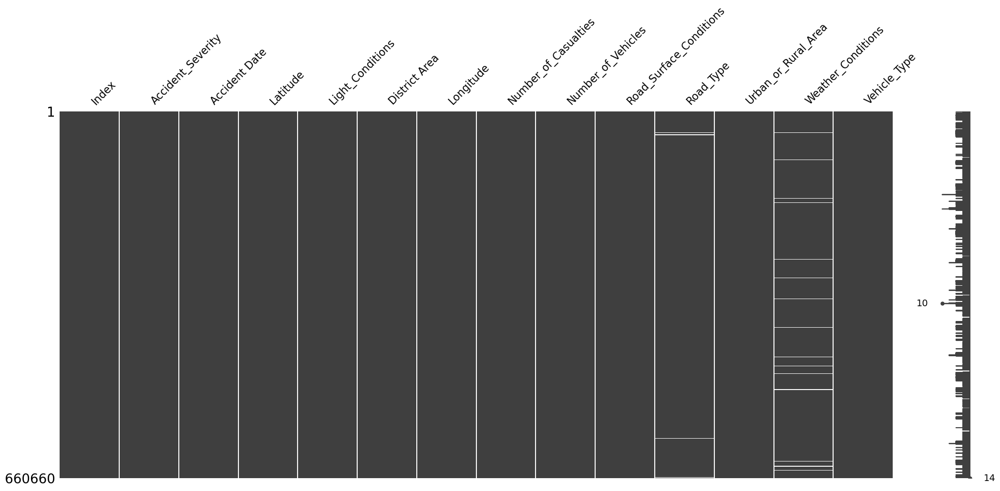

In [16]:
#visualization the missing values 
msno.matrix(df)
plt.show()

In [17]:
df.dropna(subset=['Latitude', 'Longitude', 'Urban_or_Rural_Area'], inplace=True)
df.isna().sum()

Index                          0
Accident_Severity              0
Accident Date                  0
Latitude                       0
Light_Conditions               0
District Area                  0
Longitude                      0
Number_of_Casualties           0
Number_of_Vehicles             0
Road_Surface_Conditions      726
Road_Type                   4517
Urban_or_Rural_Area            0
Weather_Conditions         14126
Vehicle_Type                   0
dtype: int64

In [18]:
df['Road_Surface_Conditions'].value_counts()

Dry                     447790
Wet or damp             186700
Frost or ice             18513
Snow                      5887
Flood over 3cm. deep      1016
Name: Road_Surface_Conditions, dtype: int64

In [19]:
df['Road_Surface_Conditions'].unique()

array(['Dry', 'Wet or damp', 'Snow', 'Frost or ice',
       'Flood over 3cm. deep', nan], dtype=object)

In [20]:
df.dropna(subset=['Road_Surface_Conditions'], inplace=True)
df.isna().sum()

Index                          0
Accident_Severity              0
Accident Date                  0
Latitude                       0
Light_Conditions               0
District Area                  0
Longitude                      0
Number_of_Casualties           0
Number_of_Vehicles             0
Road_Surface_Conditions        0
Road_Type                   4509
Urban_or_Rural_Area            0
Weather_Conditions         13514
Vehicle_Type                   0
dtype: int64

In [21]:
df['Road_Type'].value_counts()

Single carriageway    491591
Dual carriageway       99343
Roundabout             43902
One way street         13526
Slip road               7035
Name: Road_Type, dtype: int64

In [22]:
df['Road_Type'].fillna(df['Road_Type'].mode()[0], inplace=True)

In [23]:
df.isna().sum()

Index                          0
Accident_Severity              0
Accident Date                  0
Latitude                       0
Light_Conditions               0
District Area                  0
Longitude                      0
Number_of_Casualties           0
Number_of_Vehicles             0
Road_Surface_Conditions        0
Road_Type                      0
Urban_or_Rural_Area            0
Weather_Conditions         13514
Vehicle_Type                   0
dtype: int64

In [24]:
df['Weather_Conditions'].value_counts()

Fine no high winds       520752
Raining no high winds     79687
Other                     17142
Raining + high winds       9615
Fine + high winds          8550
Snowing no high winds      6237
Fog or mist                3526
Snowing + high winds        883
Name: Weather_Conditions, dtype: int64

In [25]:
df.Weather_Conditions = df.Weather_Conditions.fillna('Unknown')

In [26]:
df.isna().sum()

Index                      0
Accident_Severity          0
Accident Date              0
Latitude                   0
Light_Conditions           0
District Area              0
Longitude                  0
Number_of_Casualties       0
Number_of_Vehicles         0
Road_Surface_Conditions    0
Road_Type                  0
Urban_or_Rural_Area        0
Weather_Conditions         0
Vehicle_Type               0
dtype: int64

In [27]:
cat_columns = [ 'Accident_Severity', 'Light_Conditions',  'Road_Surface_Conditions','Road_Type', 
               'Urban_or_Rural_Area', 'Weather_Conditions','Vehicle_Type']

In [28]:
for col in cat_columns:
    print('number of uniques values in ',col ,'are : ',df[col].nunique())
    print('The uniques Values are : ')
    print(df[col].unique())
    print()

number of uniques values in  Accident_Severity are :  3
The uniques Values are : 
['Serious' 'Slight' 'Fatal']

number of uniques values in  Light_Conditions are :  5
The uniques Values are : 
['Darkness - lights lit' 'Daylight' 'Darkness - lighting unknown'
 'Darkness - lights unlit' 'Darkness - no lighting']

number of uniques values in  Road_Surface_Conditions are :  5
The uniques Values are : 
['Dry' 'Wet or damp' 'Snow' 'Frost or ice' 'Flood over 3cm. deep']

number of uniques values in  Road_Type are :  5
The uniques Values are : 
['Single carriageway' 'Dual carriageway' 'One way street' 'Roundabout'
 'Slip road']

number of uniques values in  Urban_or_Rural_Area are :  3
The uniques Values are : 
['Urban' 'Rural' 'Unallocated']

number of uniques values in  Weather_Conditions are :  9
The uniques Values are : 
['Fine no high winds' 'Raining no high winds' 'Unknown' 'Other'
 'Fine + high winds' 'Raining + high winds' 'Snowing no high winds'
 'Fog or mist' 'Snowing + high winds']


In [29]:
df['Number_of_Casualties'].value_counts()

1     503387
2     107885
3      30750
4      11153
5       4119
6       1525
7        539
8        214
9        112
10        58
11        36
13        24
12        21
14        13
15        11
17         8
16         7
19         7
18         6
22         5
21         4
29         3
28         2
42         2
24         2
40         2
27         2
47         1
26         1
48         1
32         1
45         1
62         1
68         1
25         1
43         1
Name: Number_of_Casualties, dtype: int64

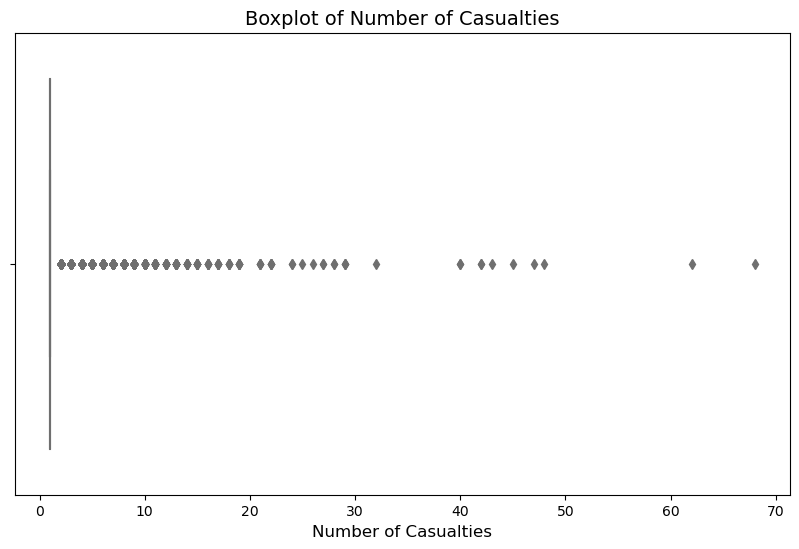

In [33]:
plt.figure(figsize=(10, 6))  # Set the figure size
sns.boxplot(data=df, x='Number_of_Casualties', color='skyblue')

# Adding a title and labels
plt.title('Boxplot of Number of Casualties', fontsize=14)
plt.xlabel('Number of Casualties', fontsize=12)

# Show the plot
plt.show()

In [40]:
outlier_threshold = 10  
high_casualties = df[df['Number_of_Casualties'] > outlier_threshold]
print(high_casualties.shape[0])  

164


In [42]:
df = df[df['Number_of_Casualties'] <= 10]

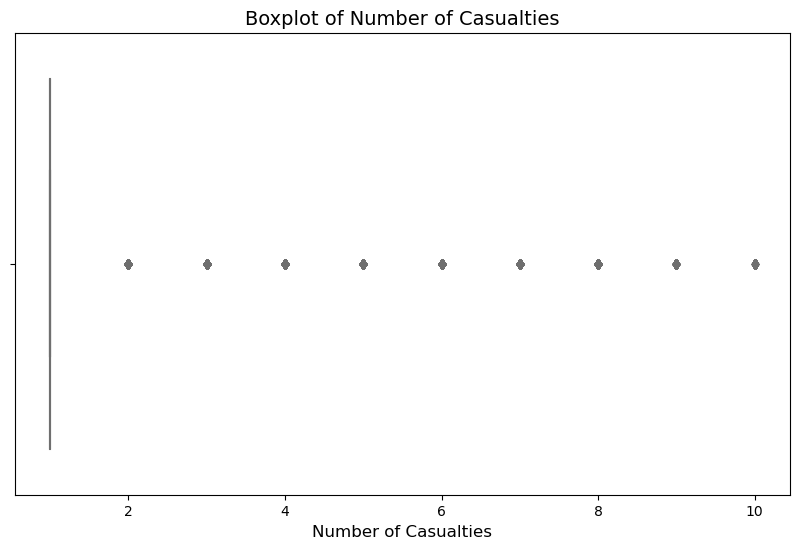

In [43]:
plt.figure(figsize=(10, 6))  # Set the figure size
sns.boxplot(data=df, x='Number_of_Casualties', color='skyblue')

# Adding a title and labels
plt.title('Boxplot of Number of Casualties', fontsize=14)
plt.xlabel('Number of Casualties', fontsize=12)

# Show the plot
plt.show()

In [45]:
df['Number_of_Vehicles'].value_counts()

2     391440
1     200506
3      52754
4      11278
5       2457
6        754
7        292
8        144
9         56
10        26
11        11
14         8
12         7
13         4
16         3
15         1
32         1
Name: Number_of_Vehicles, dtype: int64

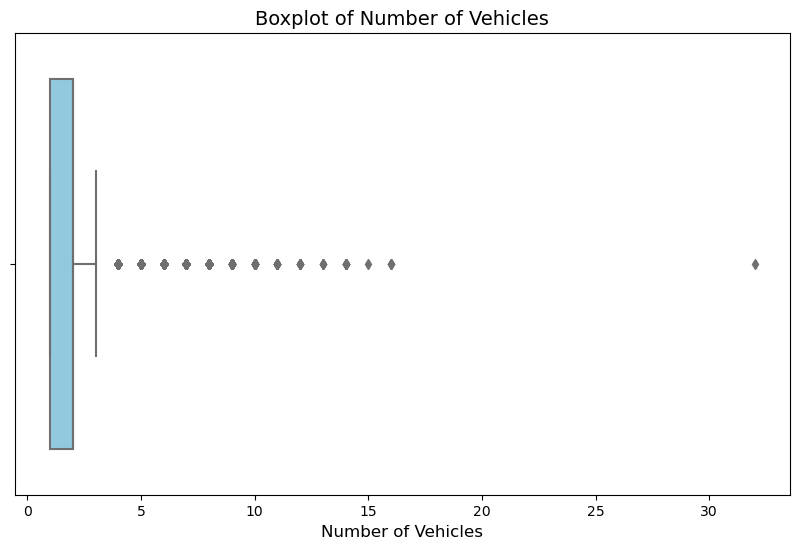

In [46]:
plt.figure(figsize=(10, 6))  # Set the figure size
sns.boxplot(data=df, x='Number_of_Vehicles', color='skyblue')

# Adding a title and labels
plt.title('Boxplot of Number of Vehicles', fontsize=14)
plt.xlabel('Number of Vehicles', fontsize=12)

# Show the plot
plt.show()

In [47]:
outlier_threshold = 10  
high_num = df[df['Number_of_Vehicles'] > outlier_threshold]
print(high_num.shape[0])  # Number of rows with high casualties

35


In [48]:
df = df[df['Number_of_Vehicles'] <= 10]

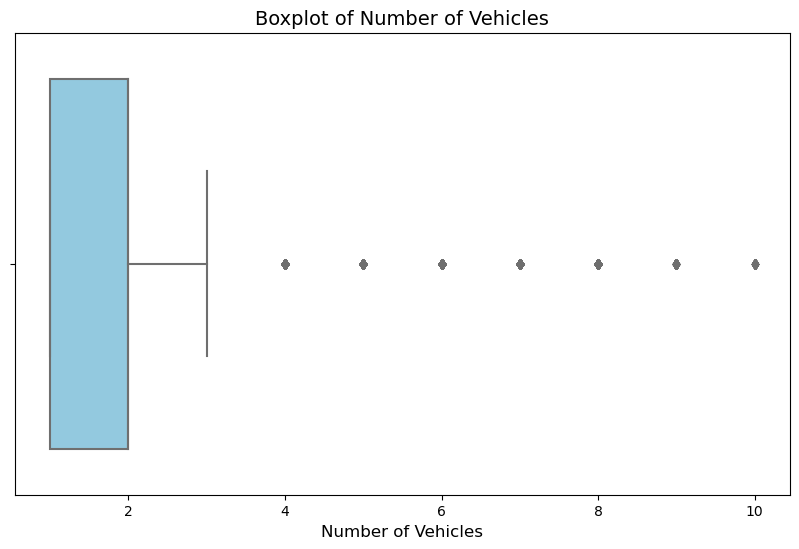

In [49]:
plt.figure(figsize=(10, 6))  # Set the figure size
sns.boxplot(data=df, x='Number_of_Vehicles', color='skyblue')

# Adding a title and labels
plt.title('Boxplot of Number of Vehicles', fontsize=14)
plt.xlabel('Number of Vehicles', fontsize=12)

# Show the plot
plt.show()

In [50]:
df['Number_of_Vehicles'].value_counts()

2     391440
1     200506
3      52754
4      11278
5       2457
6        754
7        292
8        144
9         56
10        26
Name: Number_of_Vehicles, dtype: int64

In [57]:
df.to_csv(R'C:\Users\HP2022\Desktop\archive\accident project.csv')